# Week 4 Assignment: Saliency Maps

## Download test files and weights

In [1]:
# Download the same test files from the Cats vs Dogs ungraded lab
!wget -O cat1.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat1.jpeg
!wget -O cat2.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat2.jpeg
!wget -O catanddog.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/catanddog.jpeg
!wget -O dog1.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/dog1.jpeg
!wget -O dog2.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/dog2.jpeg

# Download prepared weights
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1kipXTxesGJKGY1B8uSPRvxROgOH90fih' -O 0_epochs.h5
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1oiV6tjy5k7h9OHGTQaf0Ohn3FmF-uOs1' -O 15_epochs.h5

--2024-07-26 11:42:15--  https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat1.jpeg
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.20.207, 74.125.195.207, 74.125.142.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.20.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 414826 (405K) [image/jpeg]
Saving to: 'cat1.jpg'

cat1.jpg            100%[===================>] 405.10K  --.-KB/s    in 0.007s  

2024-07-26 11:42:15 (54.0 MB/s) - 'cat1.jpg' saved [414826/414826]

--2024-07-26 11:42:16--  https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat2.jpeg
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.197.207, 172.253.117.207, 74.125.195.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.197.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 599639 (586K) [image/jpeg]
Saving to: 

## Import the required packages

In [2]:
import tensorflow_datasets as tfds
import tensorflow as tf

import keras
from keras.models import Sequential,Model
from keras.layers import Dense,Conv2D,Flatten,MaxPooling2D,GlobalAveragePooling2D

import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import cv2

2024-07-26 11:42:30.515870: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-26 11:42:30.515971: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-26 11:42:30.648521: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Download and prepare the dataset.

### Load Cats vs Dogs

In [3]:
# Load the data and create the train set (optional: val and test sets)

# YOUR CODE HERE
train_data = tfds.load('cats_vs_dogs', split='train[:80%]', as_supervised=True)
validation_data = tfds.load('cats_vs_dogs', split='train[80%:90%]', as_supervised=True)
test_data = tfds.load('cats_vs_dogs', split='train[-10%:]', as_supervised=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


Shuffling /root/tensorflow_datasets/cats_vs_dogs/4.0.1.incomplete0DHRS4/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


### Create preprocessing function

In [4]:
def augment_images(image, label):
  # YOUR CODE HERE

  # cast to float
  image = tf.cast(image, tf.float32)
  # normalize the pixel values
  image = (image/255)
  # resize to 300 x 300
  image = tf.image.resize(image,(300,300))

  label = tf.one_hot(label, 2)
  
  return image, label

### Preprocess the training set

In [6]:
augmented_training_data = train_data.map(augment_images)

### Create batches of the training set.

In [7]:
train_batches = augmented_training_data.batch(32)

## Build the Cats vs Dogs classifier

In [8]:
model = Sequential()
model.add(Conv2D(16,input_shape=(300,300,3),kernel_size=(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(32,kernel_size=(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(64,kernel_size=(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(128,kernel_size=(3,3),activation='relu',padding='same'))
model.add(GlobalAveragePooling2D())
model.add(Dense(2,activation='sigmoid'))

model.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 300, 300, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 150, 150, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 150, 150, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 97,698 (381.63 KB)

 Trainable params: 97,698 (381.63 KB)

 Non-trainable params: 0 (0.00 B)

## Create a function to generate the saliency map

In [9]:
def do_salience(image, model, label, prefix):
  '''
  Generates the saliency map of a given image.

  Args:
    image (file) -- picture that the model will classify
    model (keras Model) -- your cats and dogs classifier
    label (int) -- ground truth label of the image
    prefix (string) -- prefix to add to the filename of the saliency map
  '''

  # Read the image and convert channel order from BGR to RGB
  # YOUR CODE HERE
  img = cv2.imread(image)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 

  # Resize the image to 300 x 300 and normalize pixel values to the range [0, 1]
  # YOUR CODE HERE
  img = cv2.resize(img, (300, 300)) / 255.0

  # Add an additional dimension (for the batch), and save this in a new variable
  # YOUR CODE HERE
  img2 = np.expand_dims(img, axis=0)

  # Declare the number of classes
  # YOUR CODE HERE
  num_classes = 2

  # Define the expected output array by one-hot encoding the label
  # The length of the array is equal to the number of classes
  # YOUR CODE HERE
  expected_output = tf.one_hot([label] * img2.shape[0], num_classes)

  # Witin the GradientTape block:
  # Cast the image as a tf.float32
  # Use the tape to watch the float32 image
  # Get the model's prediction by passing in the float32 image
  # Compute an appropriate loss
  # between the expected output and model predictions.
  # you may want to print the predictions to see if the probabilities adds up to 1
  # YOUR CODE HERE
  with tf.GradientTape() as tape:
    inputs = tf.cast(img2, tf.float32)
    tape.watch(inputs)
    predictions = model(inputs)
    loss = tf.keras.losses.categorical_crossentropy(
        expected_output, predictions
    )

  # get the gradients of the loss with respect to the model's input image
  # YOUR CODE HERE
  gradients = tape.gradient(loss, inputs)
    
  # generate the grayscale tensor
  # YOUR CODE HERE
  grayscale_tensor = tf.reduce_sum(tf.abs(gradients), axis=-1)

  # normalize the pixel values to be in the range [0, 255].
  # the max value in the grayscale tensor will be pushed to 255.
  # the min value will be pushed to 0.
  # Use the formula: 255 * (x - min) / (max - min)
  # Use tf.reduce_max, tf.reduce_min
  # Cast the tensor as a tf.uint8
  # YOUR CODE HERE
  normalized_tensor = tf.cast(
    255
    * (grayscale_tensor - tf.reduce_min(grayscale_tensor))
    / (tf.reduce_max(grayscale_tensor) - tf.reduce_min(grayscale_tensor)),
    tf.uint8
  )
    
  # Remove dimensions that are size 1
  # YOUR CODE HERE
  normalized_tensor = tf.squeeze(normalized_tensor)
    
  # plot the normalized tensor
  # Set the figure size to 8 by 8
  # do not display the axis
  # use the 'gray' colormap
  # This code is provided for you.
  plt.figure(figsize=(8, 8))
  plt.axis('off')
  plt.imshow(normalized_tensor, cmap='gray')
  plt.show()

  # optional: superimpose the saliency map with the original image, then display it.
  # we encourage you to do this to visualize your results better
  # YOUR CODE HERE
  gradient_color = cv2.applyColorMap(normalized_tensor.numpy(), cv2.COLORMAP_HOT)
  gradient_color = gradient_color / 255.0
  super_imposed = cv2.addWeighted(img, 0.5, gradient_color, 0.5, 0.0)

  # plot super imposed tensor
  plt.figure(figsize=(8, 8))
  plt.axis('off')
  plt.imshow(super_imposed, cmap='gray')
  plt.show()

  # save the normalized tensor image to a file. this is already provided for you.
  salient_image_name = prefix + image
  normalized_tensor = tf.expand_dims(normalized_tensor, -1)
  normalized_tensor = tf.io.encode_jpeg(normalized_tensor, quality=100, format='grayscale')
  writer = tf.io.write_file(salient_image_name, normalized_tensor)

### Generate saliency maps with untrained model

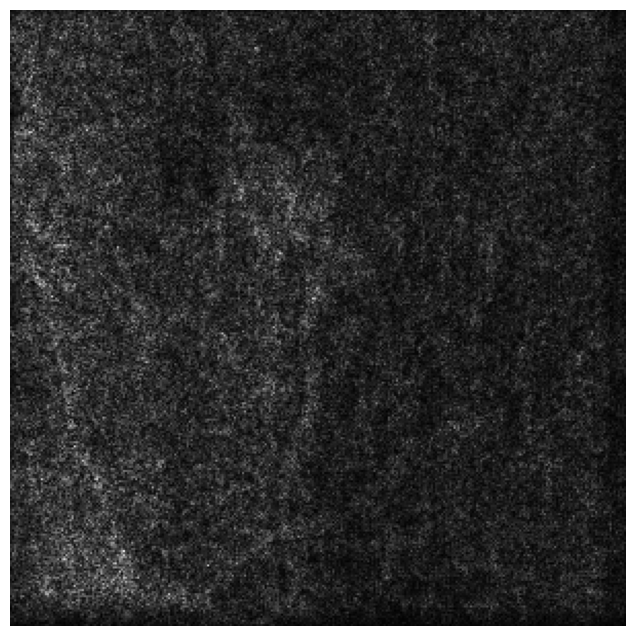

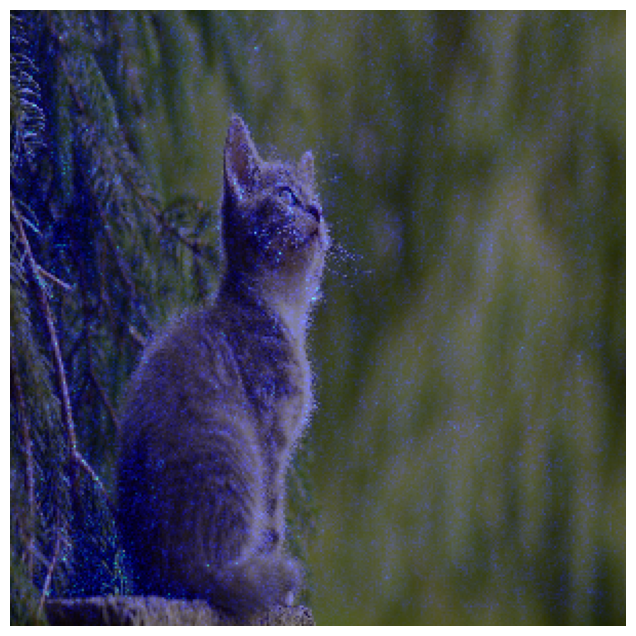

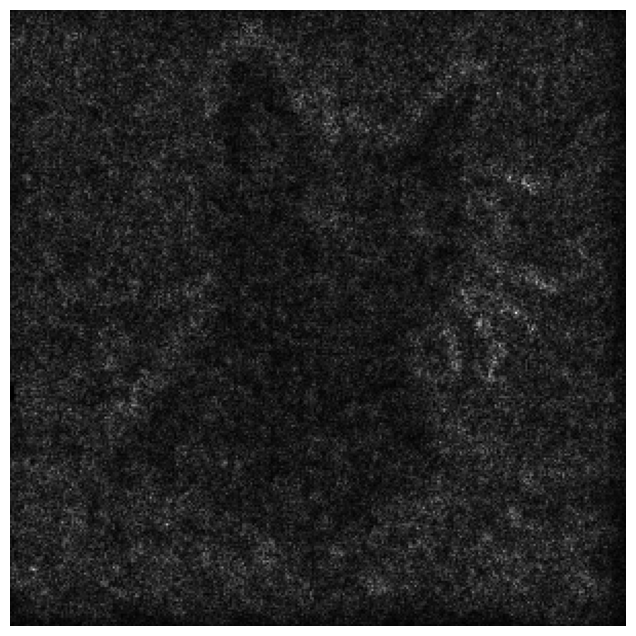

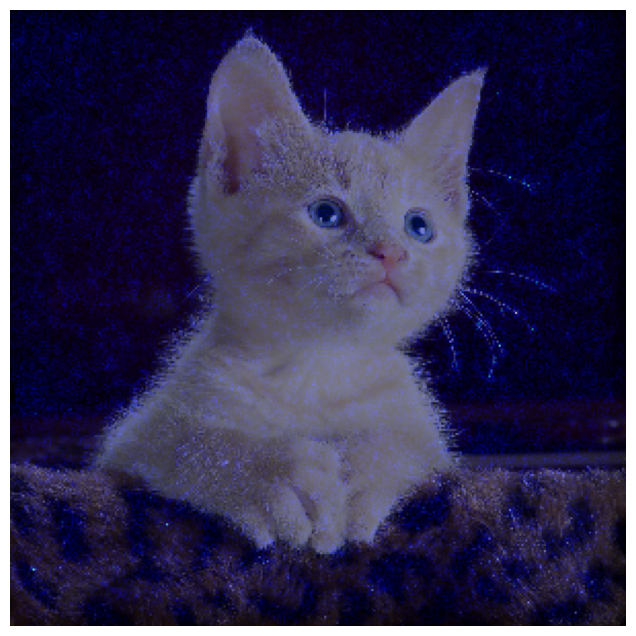

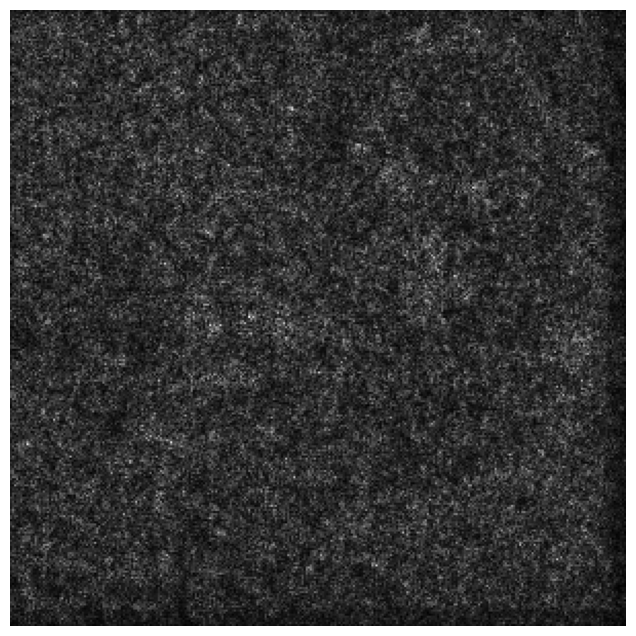

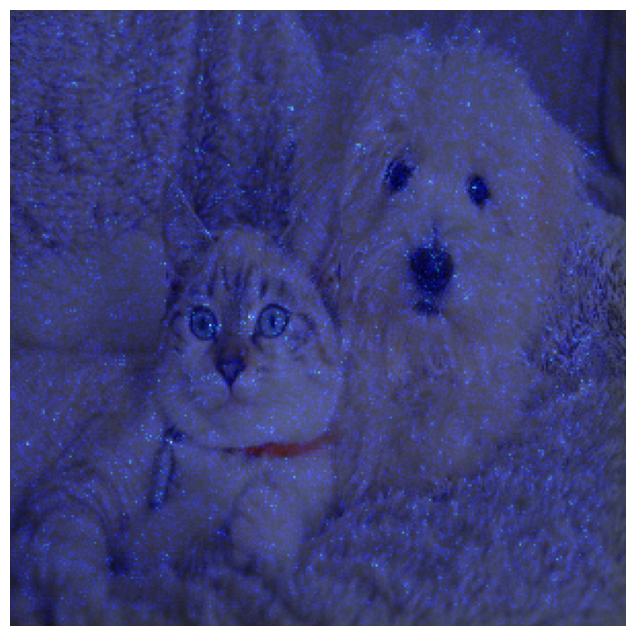

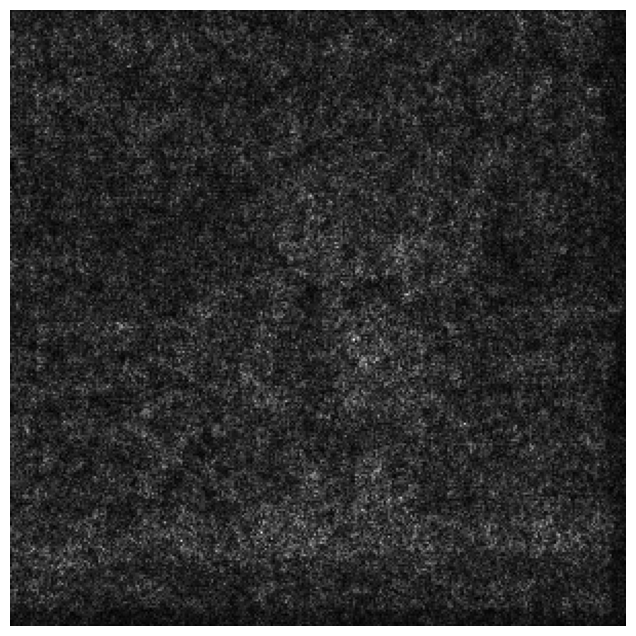

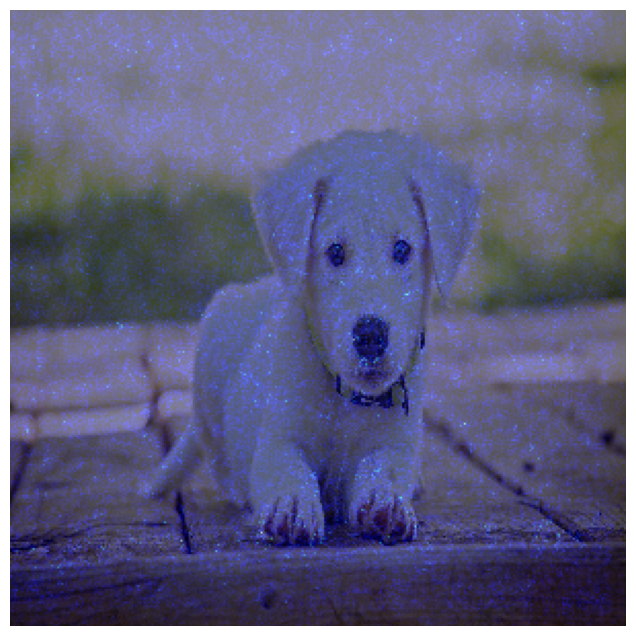

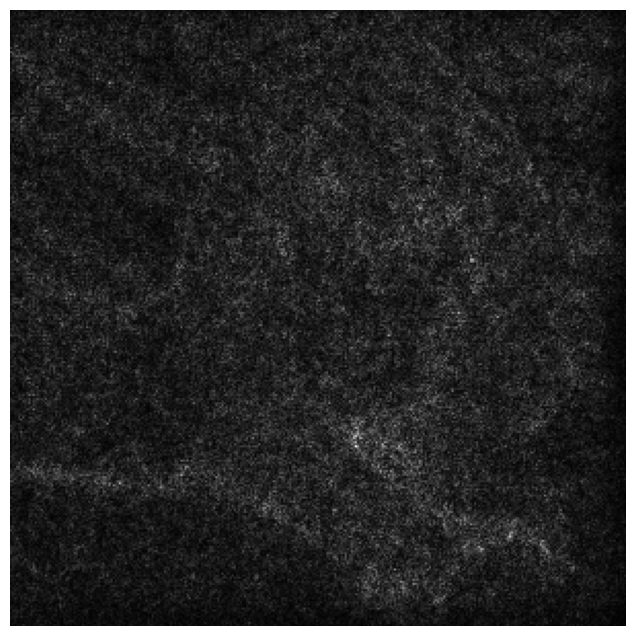

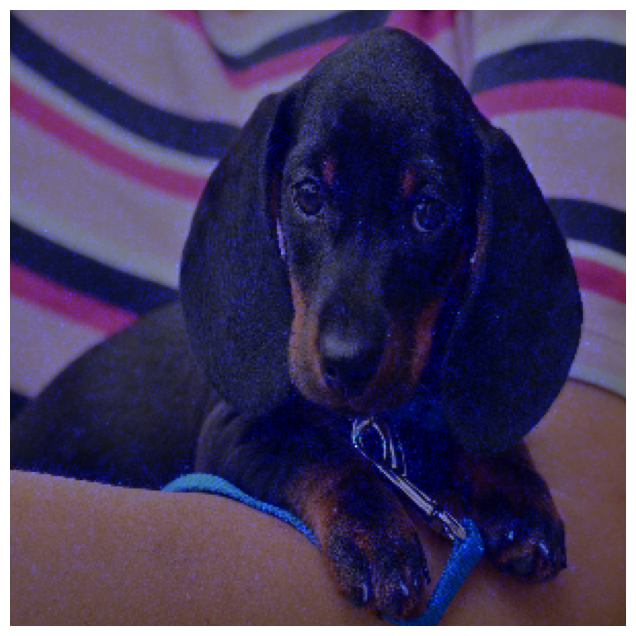

In [10]:
# load initial weights
model.load_weights('0_epochs.h5')

# generate the saliency maps for the 5 test images
# YOUR CODE HERE
do_salience('cat1.jpg', model, 0, 'epoch0_salient')
do_salience('cat2.jpg', model, 0, 'epoch0_salient')
do_salience('catanddog.jpg', model, 0, 'epoch0_salient')
do_salience('dog1.jpg', model, 1, 'epoch0_salient')
do_salience('dog2.jpg', model, 1, 'epoch0_salient')

### Configure the model for training

In [11]:
model.compile(loss='categorical_crossentropy',
              metrics=['accuracy'],
              optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001))

In [12]:
# load pre-trained weights
model.load_weights('15_epochs.h5')

# train the model for just 3 epochs
# YOUR CODE HERE
model.fit(train_batches, epochs=3)

Epoch 1/3


2024-07-26 11:44:24.477826: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 180000: 3.34346, expected 2.84536
2024-07-26 11:44:24.477900: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 180001: 3.65325, expected 3.15516
2024-07-26 11:44:24.477911: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 180008: 3.91897, expected 3.42087
2024-07-26 11:44:24.477919: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 180023: 3.90653, expected 3.40844
2024-07-26 11:44:24.477927: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 180029: 3.94016, expected 3.44207
2024-07-26 11:44:24.477936: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 180031: 3.85116, expected 3.35306
2024-07-26 11:44:24.477944: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 180032: 3.82861, expected 3.33052
2024-07-26 11:44:24.

  4/582 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step - accuracy: 0.4551 - loss: 137.4890

I0000 00:00:1721994269.902095      94 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


579/582 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5146 - loss: 383.5145

2024-07-26 11:44:46.726452: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 90000: 3.52466, expected 2.72593
2024-07-26 11:44:46.726521: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 90001: 4.51216, expected 3.71343
2024-07-26 11:44:46.726537: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 90002: 3.85405, expected 3.05532
2024-07-26 11:44:46.726551: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 90003: 5.40604, expected 4.60731
2024-07-26 11:44:46.726563: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 90004: 5.41839, expected 4.61966
2024-07-26 11:44:46.726586: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 90005: 4.30413, expected 3.5054
2024-07-26 11:44:46.726599: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 90006: 5.4887, expected 4.68997
2024-07-26 11:44:46.726610: E

582/582 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step - accuracy: 0.5146 - loss: 382.8855
Epoch 2/3
  1/582 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - accuracy: 0.4688 - loss: 76.8192

W0000 00:00:1721994290.159356      95 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


582/582 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - accuracy: 0.5125 - loss: 79.0462
Epoch 3/3
582/582 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - accuracy: 0.5274 - loss: 34.3721


### Generate saliency maps at 18 epochs

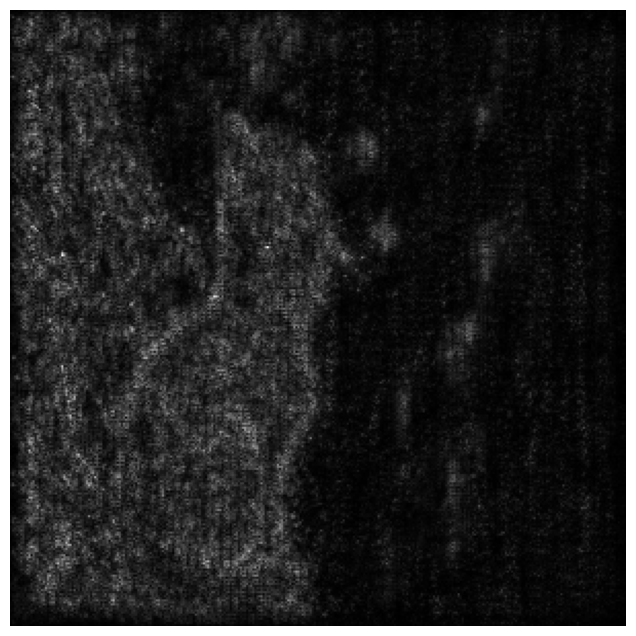

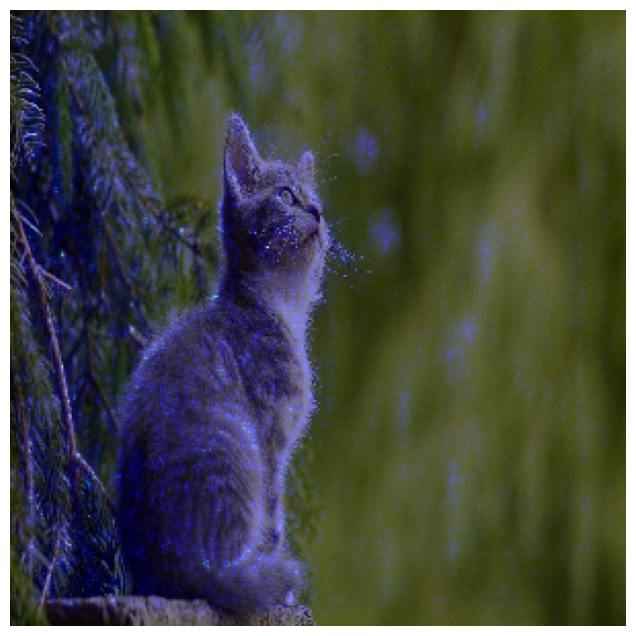

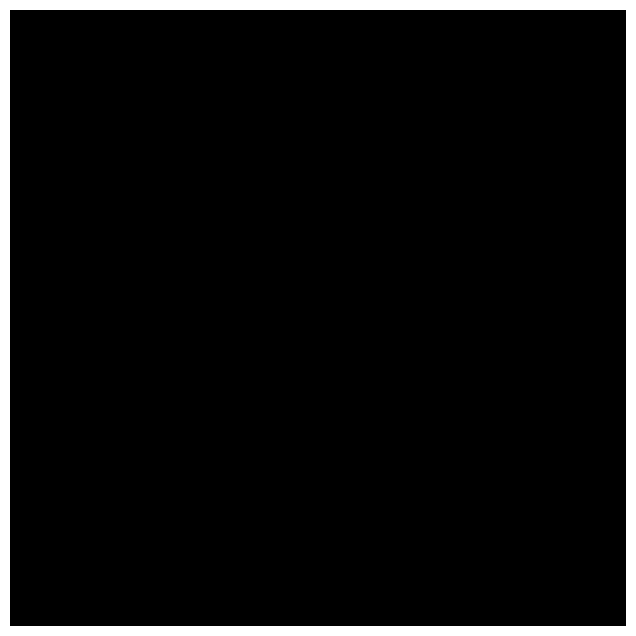

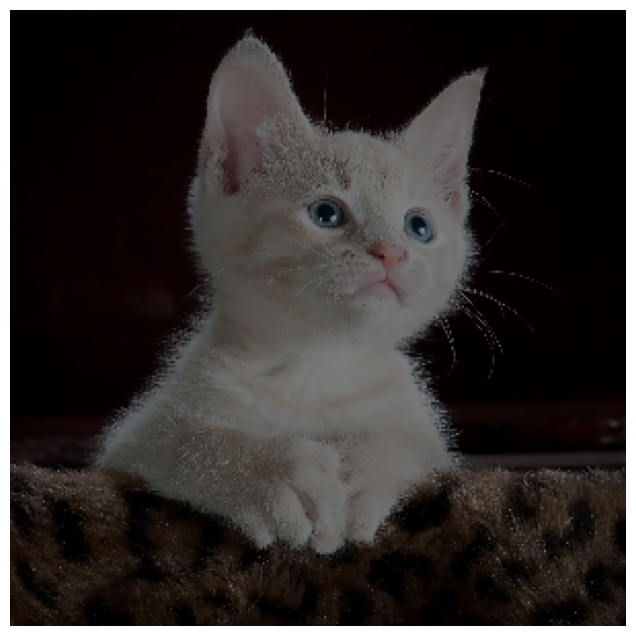

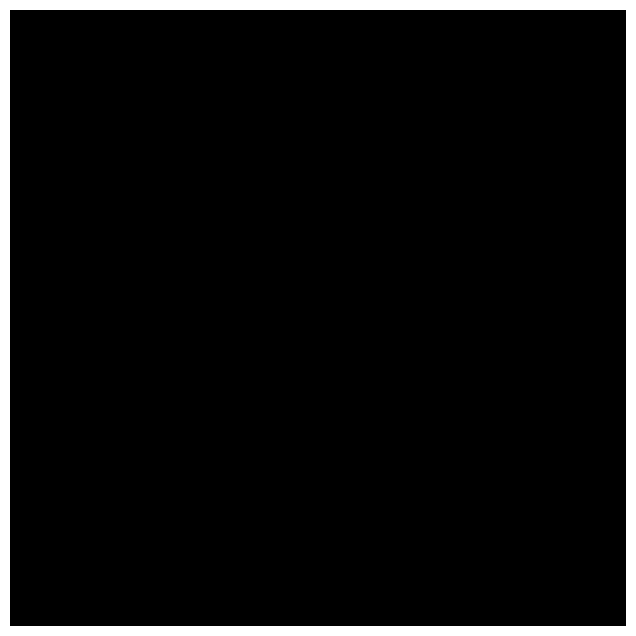

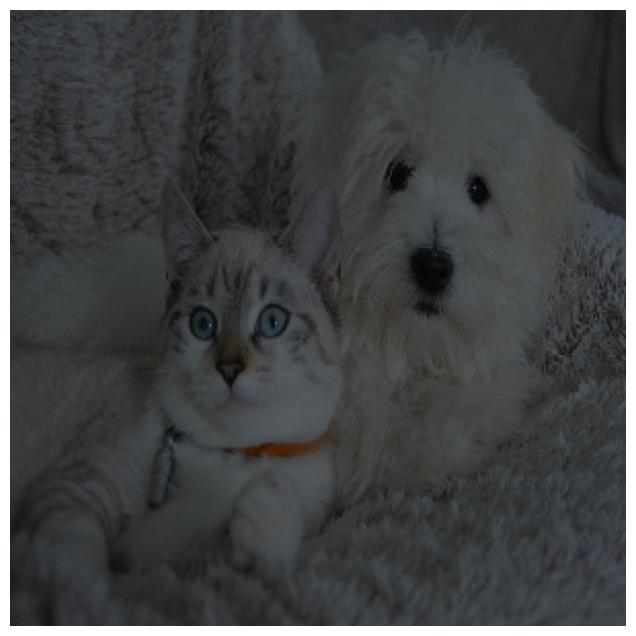

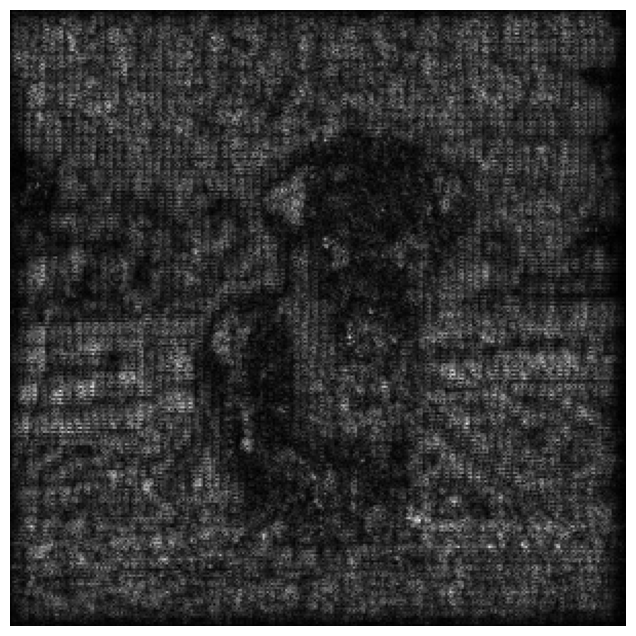

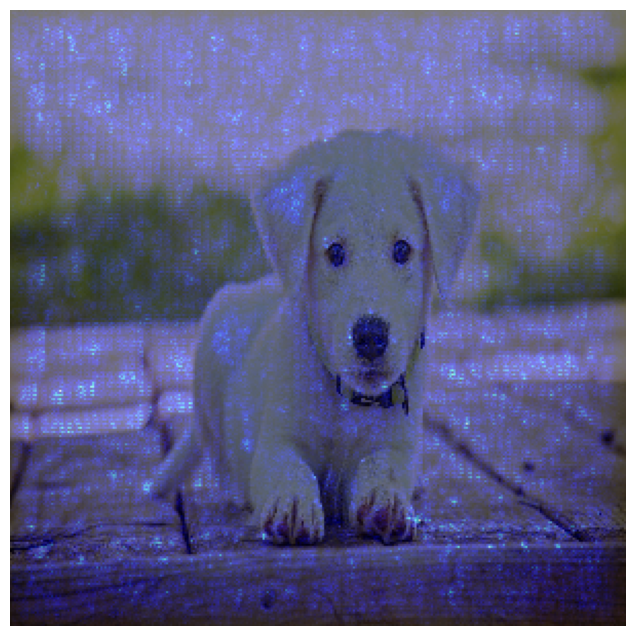

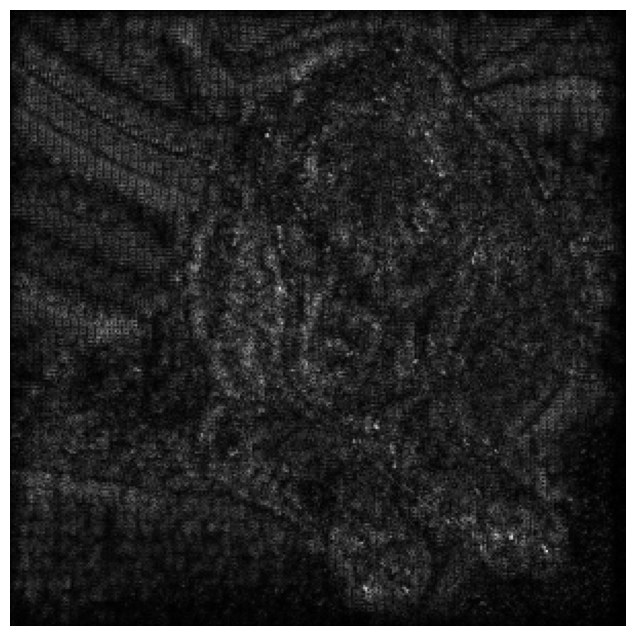

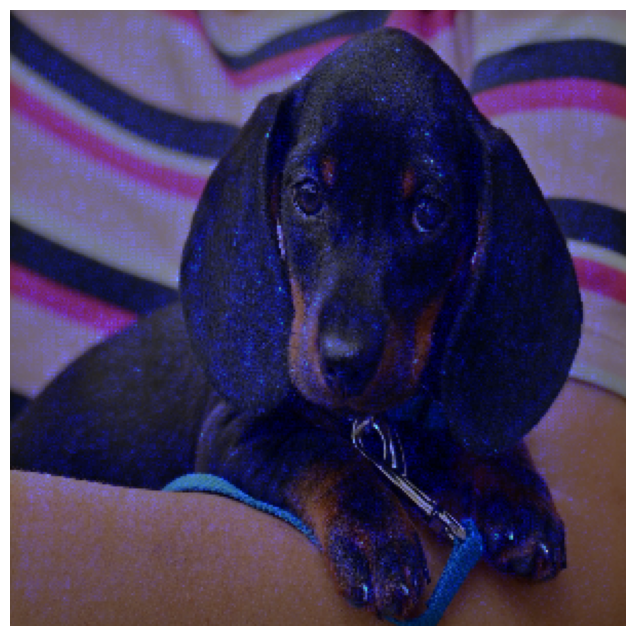

In [13]:
# YOUR CODE HERE
do_salience('cat1.jpg', model, 0, 'salient')
do_salience('cat2.jpg', model, 0, 'salient')
do_salience('catanddog.jpg', model, 0, 'salient')
do_salience('dog1.jpg', model, 1, 'salient')
do_salience('dog2.jpg', model, 1, 'salient')

### Zip the images for grading

In [14]:
from zipfile import ZipFile

!rm images.zip

filenames = ['cat1.jpg', 'cat2.jpg', 'catanddog.jpg', 'dog1.jpg', 'dog2.jpg']

# writing files to a zipfile 
with ZipFile('images.zip','w') as zip:
  for file in filenames:
    zip.write('salient' + file)

print("images.zip generated!")

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


rm: cannot remove 'images.zip': No such file or directory
images.zip generated!


### Optional: Saliency Maps at 95 epochs

--2024-07-26 11:45:28--  https://docs.google.com/uc?export=download&id=14vFpBJsL_TNQeugX8vUTv8dYZxn__fQY
Resolving docs.google.com (docs.google.com)... 74.125.135.138, 74.125.135.102, 74.125.135.101, ...
Connecting to docs.google.com (docs.google.com)|74.125.135.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=14vFpBJsL_TNQeugX8vUTv8dYZxn__fQY&export=download [following]
--2024-07-26 11:45:28--  https://drive.usercontent.google.com/download?id=14vFpBJsL_TNQeugX8vUTv8dYZxn__fQY&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 108.177.98.132, 2607:f8b0:400e:c06::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|108.177.98.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 414488 (405K) [application/octet-stream]
Saving to: '95_epochs.h5'

95_epochs.h5        100%[===================>] 404.77K  --.-KB/s    in 0

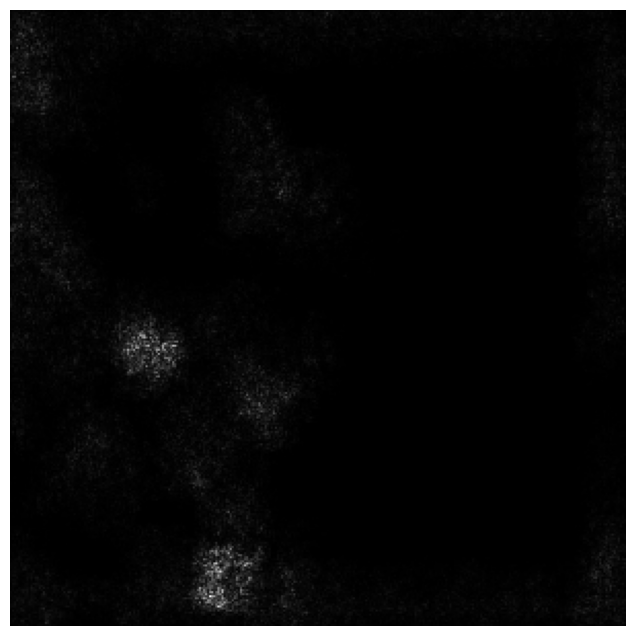

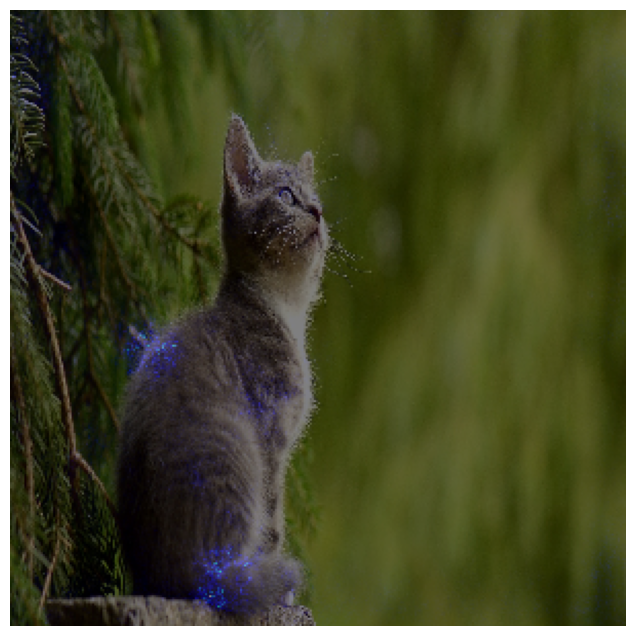

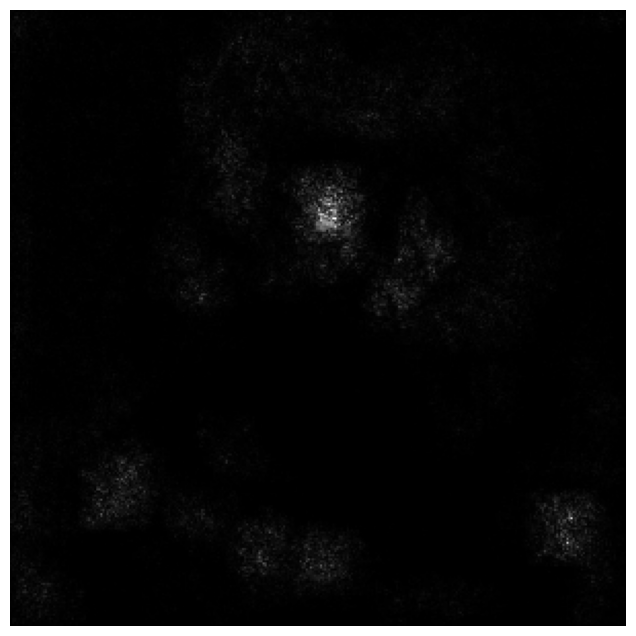

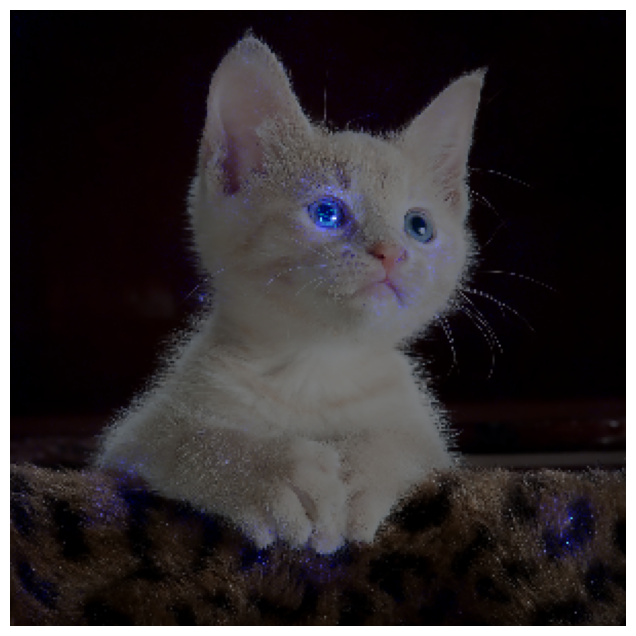

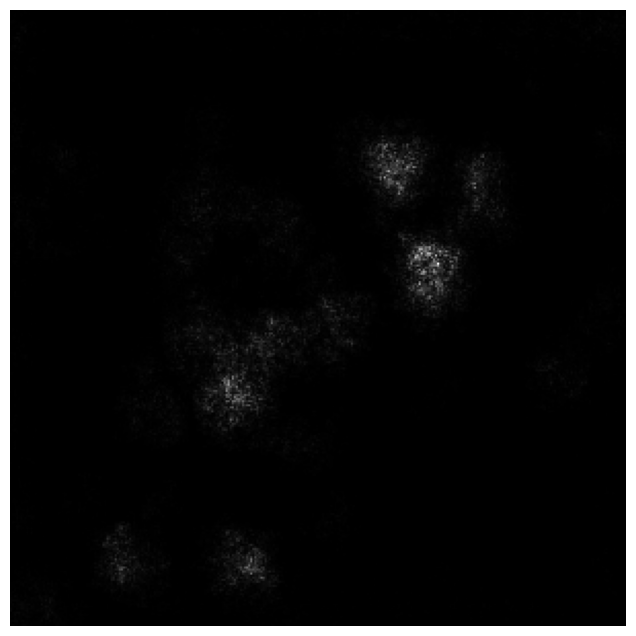

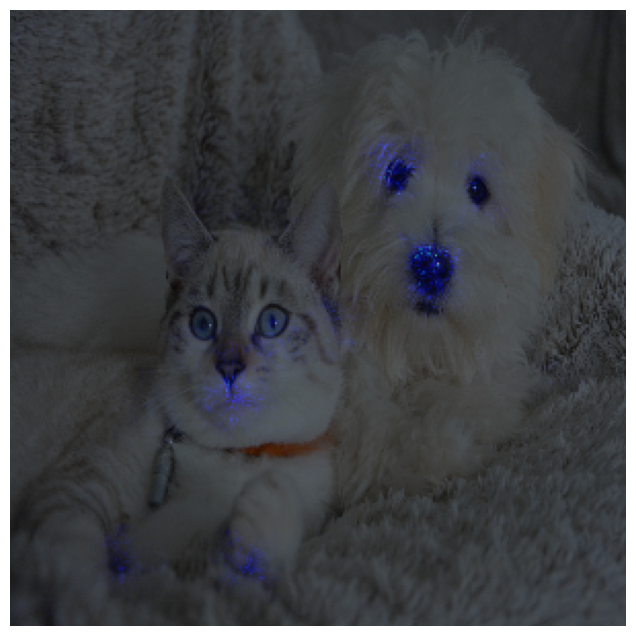

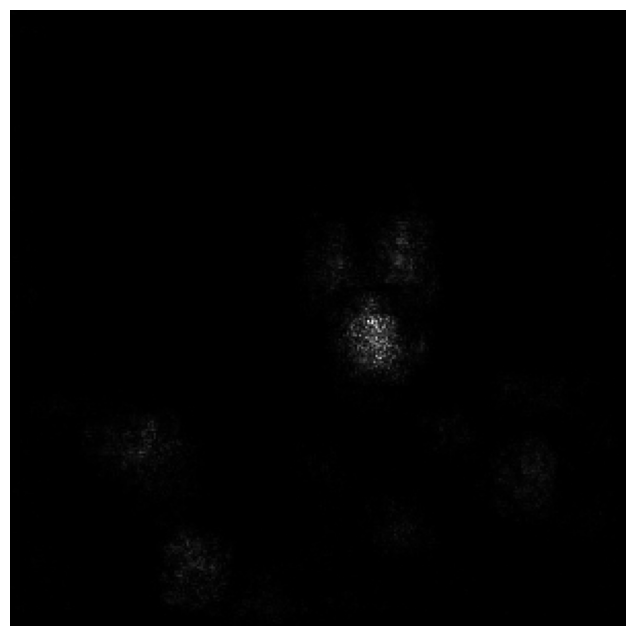

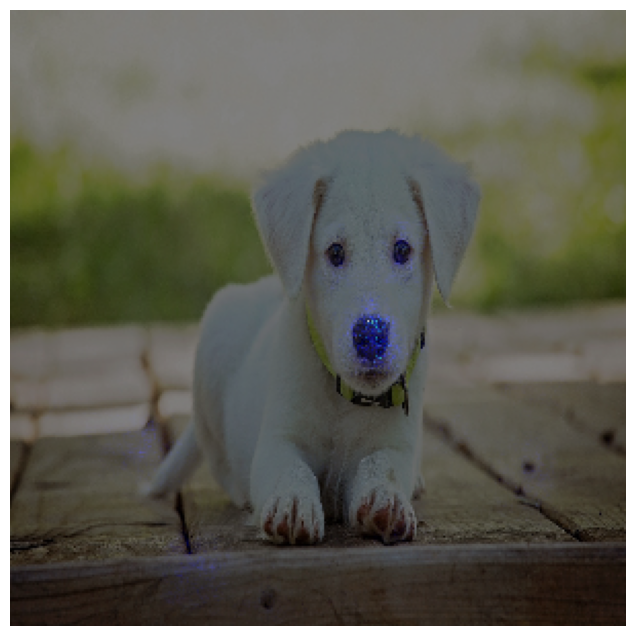

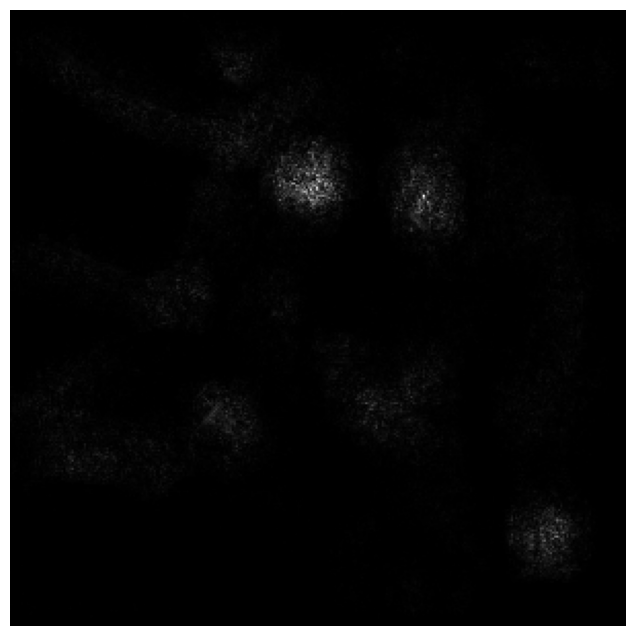

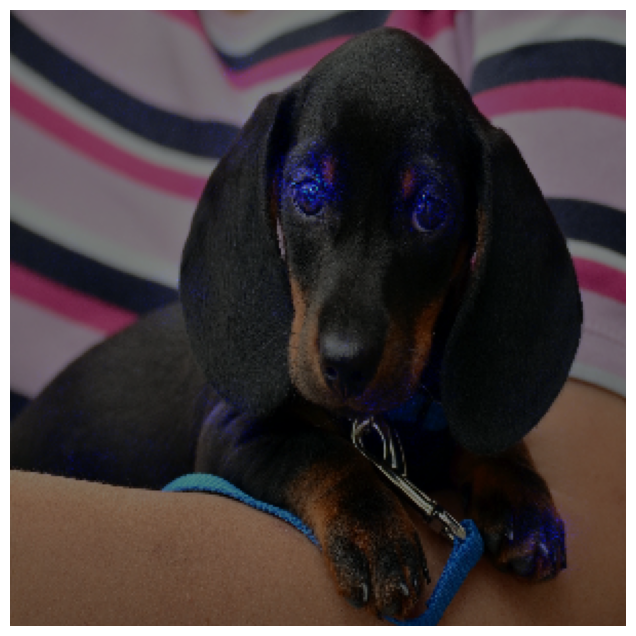

In [15]:
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=14vFpBJsL_TNQeugX8vUTv8dYZxn__fQY' -O 95_epochs.h5

model.load_weights('95_epochs.h5')

do_salience('cat1.jpg', model, 0, "epoch95_salient")
do_salience('cat2.jpg', model, 0, "epoch95_salient")
do_salience('catanddog.jpg', model, 0, "epoch95_salient")
do_salience('dog1.jpg', model, 1, "epoch95_salient")
do_salience('dog2.jpg', model, 1, "epoch95_salient")